In [64]:
import os
import tensorflow as tf
import keras.backend as K
import keras
from pybedtools import BedTool

In [335]:
%load_ext autoreload
%autoreload 2
%matplotlib inline

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


In [163]:
from pwm_utils import create_tensorflow_session
from pwm_utils import pfm_counts_pipeline_seq_models

ImportError: cannot import name pfm_counts_pipeline_seq_models

In [12]:
sess = create_tensorflow_session(0)

In [13]:
K.set_session(sess)

In [172]:
path_to_seq_model_yaml = '/srv/scratch/manyu/NIPS_workshop_tests/train_models/H1_models/CEBPB/logdir_seq_revcomp_shallow_CEBPB_ENCSR000EBV_Maxpool75_stride75_numFilters60_dropout0.2/model.arch.yaml'
path_to_seq_model_weights = '/srv/scratch/manyu/NIPS_workshop_tests/train_models/H1_models/CEBPB/logdir_seq_revcomp_shallow_CEBPB_ENCSR000EBV_Maxpool75_stride75_numFilters60_dropout0.2/model.weights.h5'

In [15]:
from keras.models import model_from_yaml

In [367]:
path_to_seq_meth_yaml = '/srv/scratch/manyu/NIPS_workshop_tests/train_models/H1_models/CEBPB/logdir_seq_meth_revcomp_shallow_CEBPB_ENCSR000EBV_Maxpool75_stride75_numFilters60_dropout0.2/model.arch.yaml'
path_to_seq_meth_model_weights = '/srv/scratch/manyu/NIPS_workshop_tests/train_models/H1_models/CEBPB/logdir_seq_meth_revcomp_shallow_CEBPB_ENCSR000EBV_Maxpool75_stride75_numFilters60_dropout0.2/model.weights.h5'

In [361]:
with open(path_to_seq_model_yaml,'r') as f:
    model_seq = model_from_yaml(f.read())
model_seq.load_weights(path_to_seq_model_weights)    

In [368]:
with open(path_to_seq_meth_yaml,'r') as f:
    model_seq_meth = model_from_yaml(f.read())

model_seq_meth.load_weights(path_to_seq_meth_model_weights)    
    

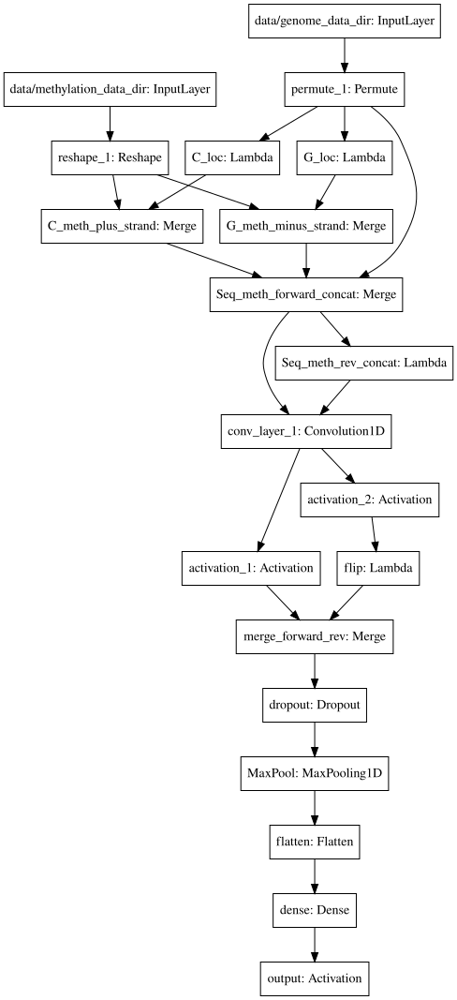

In [348]:
from IPython.display import SVG
from keras.utils.visualize_util import model_to_dot

SVG(model_to_dot(model_seq_meth).create(prog='dot', format='svg'))



In [33]:
conv_filters_seq = model_seq.get_layer('conv_layer_1').get_weights()

In [36]:
conv_filters_seq[0].shape

(35, 1, 4, 60)

In [58]:
conv_filters_seq_meth = model_seq_meth.get_layer('conv_layer_1').get_weights()
conv_filters_seq_meth[0].shape

(35, 1, 6, 60)

In [41]:
model_seq_only_old = '/srv/scratch/manyu/NIPS_workshop_tests/train_models/H1_models/CEBPB/logdir_seq_shallow_CEBPB_ENCSR000EBV_Maxpool75_stride10_numFilters35/model.arch.json'
model_seq_only_old_weights = '/srv/scratch/manyu/NIPS_workshop_tests/train_models/H1_models/CEBPB/logdir_seq_shallow_CEBPB_ENCSR000EBV_Maxpool75_stride10_numFilters35/model.weights.h5'

In [38]:
from keras.models import model_from_json

In [42]:
model_seq_only_Old = model_from_json(open(model_seq_only_old,'r').read())
model_seq_only_Old.load_weights(model_seq_only_old_weights)

In [48]:
conv_seq_old = model_seq_only_Old.get_layer('convolution1d_1').get_weights()

In [50]:
path_to_seq_meth_shallow_dropout = '/srv/scratch/manyu/NIPS_workshop_tests/train_models/H1_models/CEBPB/logdir_seq_meth_shallow_CEBPB_ENCSR000EBV_Maxpool75_stride75_numFilters60_Dropout0.2/model.arch.json'
path_to_seq_meth_shallow_dropout_weights = '/srv/scratch/manyu/NIPS_workshop_tests/train_models/H1_models/CEBPB/logdir_seq_meth_shallow_CEBPB_ENCSR000EBV_Maxpool75_stride75_numFilters60_Dropout0.2/model.weights.h5'

In [51]:
with open(path_to_seq_meth_shallow_dropout,'r') as f:
    model_seq_meth_dropout = model_from_json(f.read())

In [52]:
model_seq_meth_dropout.load_weights(path_to_seq_meth_shallow_dropout_weights)

In [53]:
model_seq_meth_dropout_conv=model_seq_meth_dropout.get_layer('convolution1d_1').get_weights()

In [54]:
model_seq_meth_dropout_conv[0].shape

(35, 1, 5, 60)

In [59]:
filters_seq_meth,biases_seq_meth = conv_filters_seq_meth[0],conv_filters_seq_meth[1]

In [60]:
filters_seq_meth.shape,biases_seq_meth.shape

((35, 1, 6, 60), (60,))

In [61]:
filters_seq_meth_reshape = filters_seq_meth.transpose((2,0,1,3))

In [62]:
filters_seq_meth_reshape.shape

(6, 35, 1, 60)

In [65]:
path_to_positive_intervals_H1 = '/srv/scratch/manyu/NIPS_workshop_tests/motif_analysis/intervals_to_evaluate/CEBPB_H1_positives.bed'
pos_bedtools_CEBPB_H1 = BedTool(path_to_positive_intervals_H1)

In [66]:
genome_path = '/srv/scratch/genomelake_data/GRCh38.genome.fa/'

In [67]:
from pwm_utils import pfm_counts_pipeline

In [69]:
intervals_list = [pos_bedtools_CEBPB_H1[i] for i in range(10)]

In [70]:
from genomelake.extractors import ArrayExtractor
genome_extractor = ArrayExtractor(genome_path)
extracted_interval = genome_extractor(intervals_list)

In [74]:
filters_seq_meth.shape,extracted_interval.shape

((35, 1, 6, 60), (10, 1000, 4))

In [75]:
filters_seq,biases_seq = conv_filters_seq[0],conv_filters_seq[1]
counts,info = pfm_counts_pipeline_s(pos_bedtools_CEBPB_H1,genome_path,filters_seq,biases_seq,500)

Creating intervals list 

Reshaping Intervals and filters to use tf.nn.conv2D
All shapes are compatible:
Proceeding with convolutions:
Doing filter 0
Doing filter 1
Doing filter 2
Doing filter 3
Doing filter 4
Doing filter 5
Doing filter 6
Doing filter 7
Doing filter 8
Doing filter 9
Doing filter 10
Doing filter 11
Doing filter 12
Doing filter 13
Doing filter 14
Doing filter 15
Doing filter 16
Doing filter 17
Doing filter 18
Doing filter 19
Doing filter 20
Doing filter 21
Doing filter 22
Doing filter 23
Doing filter 24
Doing filter 25
Doing filter 26
Doing filter 27
Doing filter 28
Doing filter 29
Doing filter 30
Doing filter 31
Doing filter 32
Doing filter 33
Doing filter 34
Doing filter 35
Doing filter 36
Doing filter 37
Doing filter 38
Doing filter 39
Doing filter 40
Doing filter 41
Doing filter 42
Doing filter 43
Doing filter 44
Doing filter 45
Doing filter 46
Doing filter 47
Doing filter 48
Doing filter 49
Doing filter 50
Doing filter 51
Doing filter 52
Doing filter 53
Doing filte

In [79]:
import sys
sys.path.insert(0,'/srv/scratch/manyu/software/modisco_private/modisco/visualization/')
import viz_sequence

0


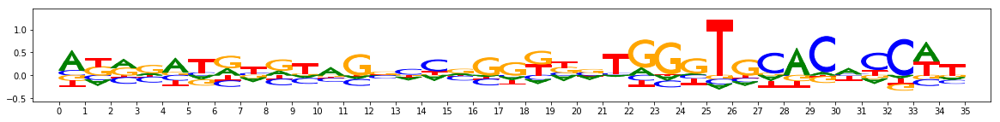

1


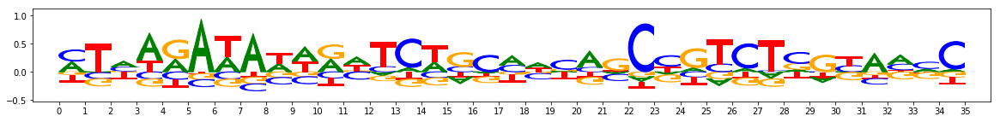

2


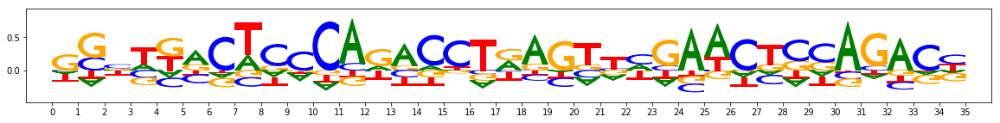

3


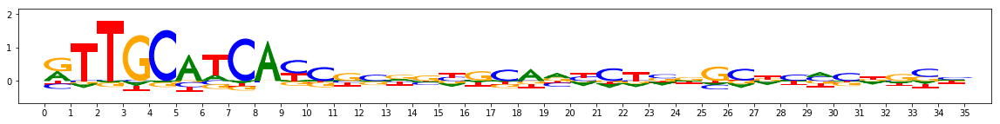

4


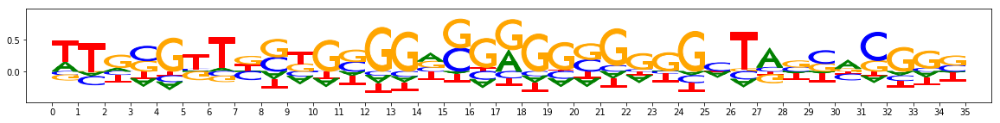

5


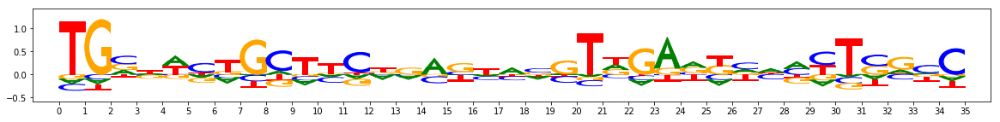

6


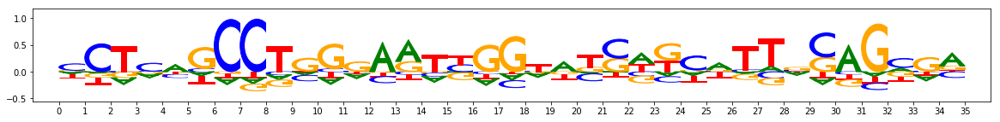

7


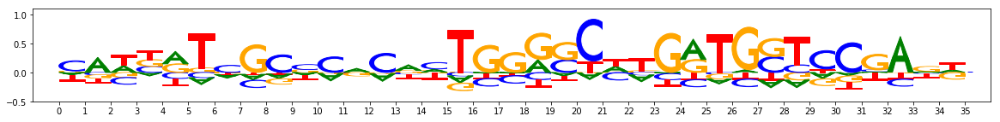

8


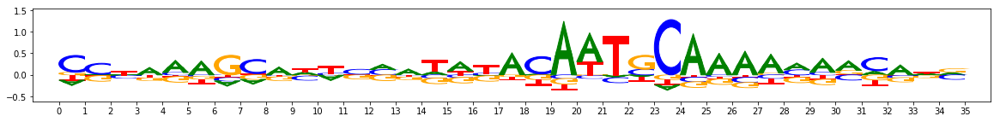

9


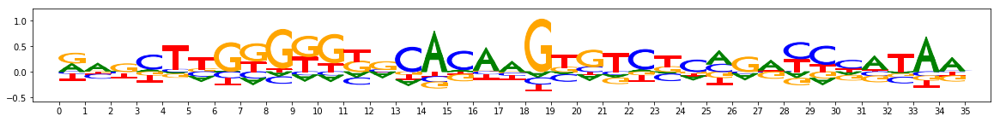

10


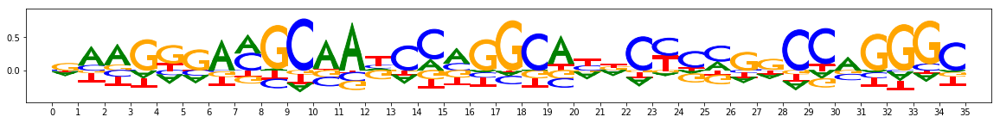

11


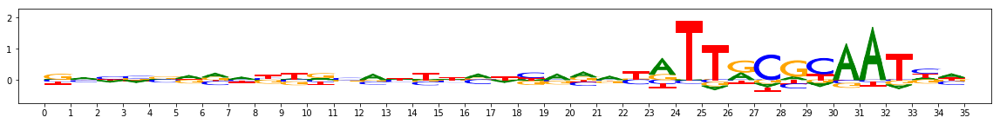

12


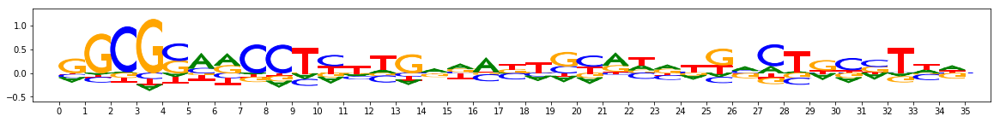

13


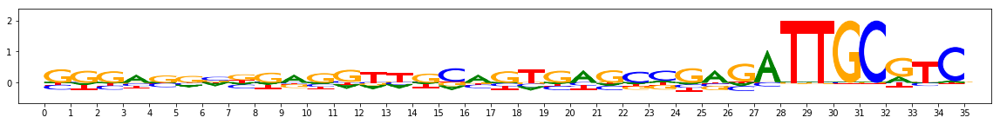

14


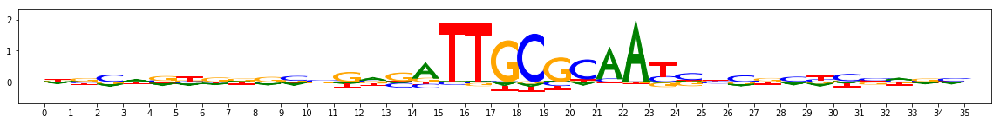

15


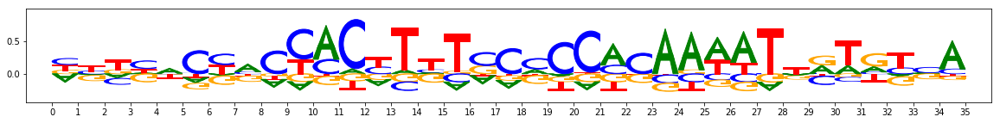

16


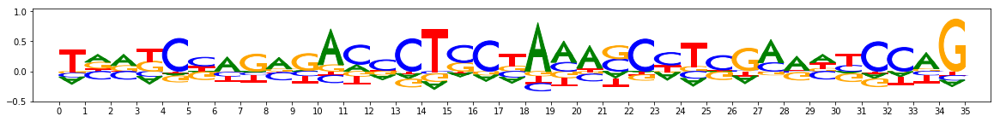

17


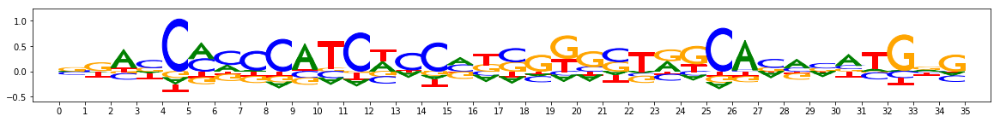

18


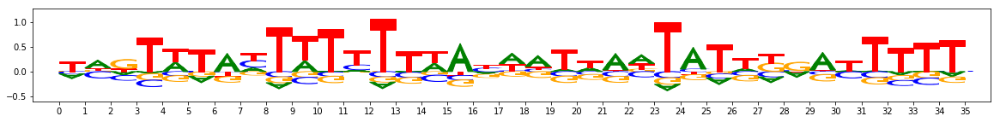

19


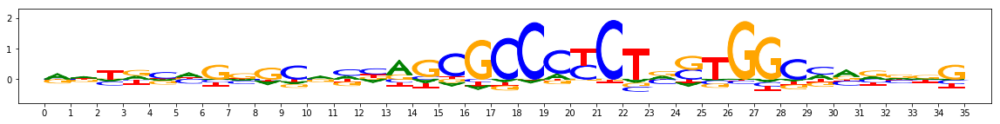

20


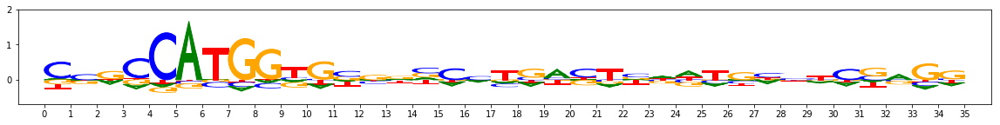

21


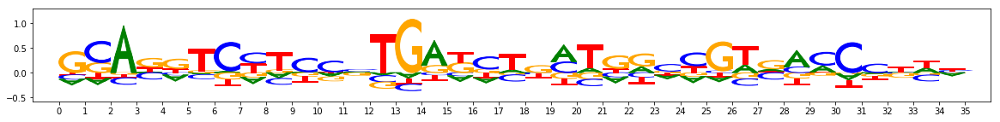

22


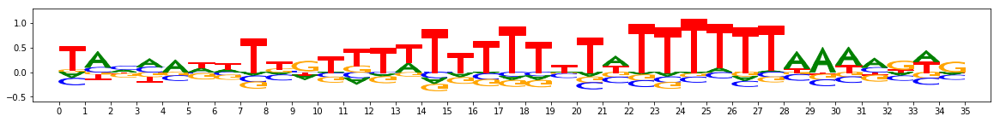

23


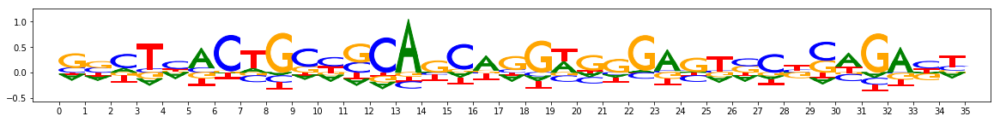

24


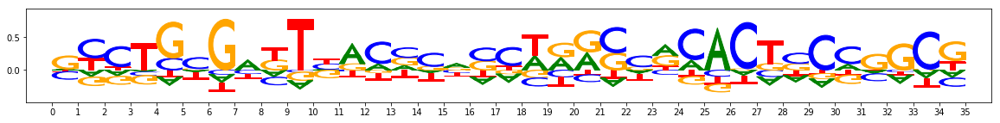

25


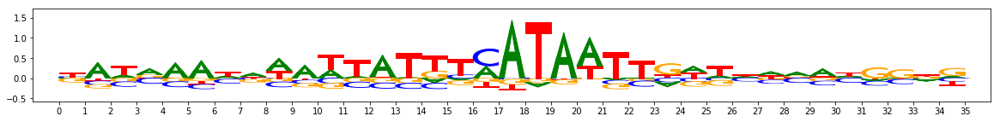

26


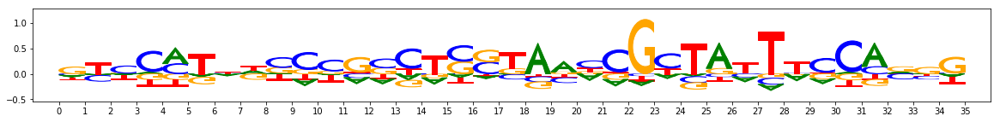

27


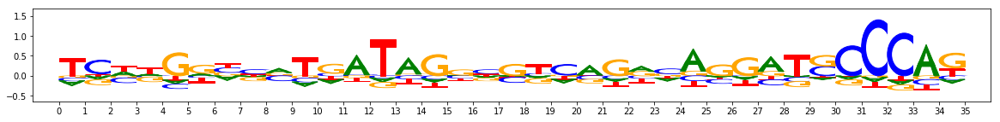

28


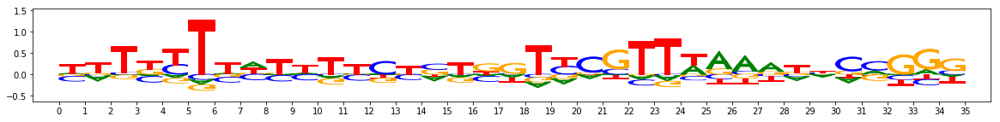

29


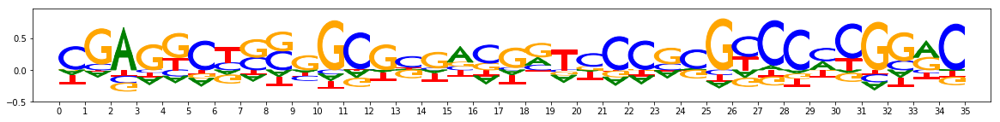

30


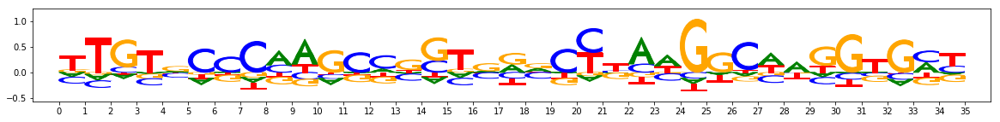

31


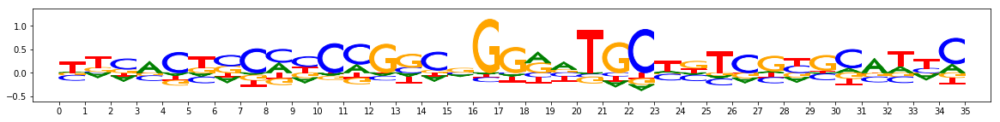

32


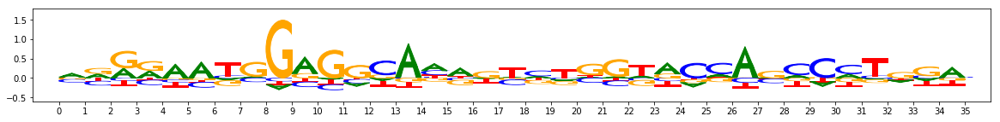

33


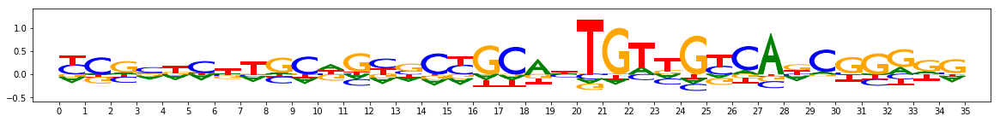

34


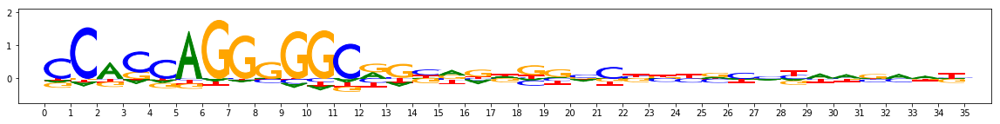

35


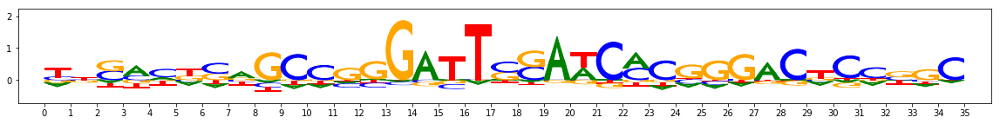

36


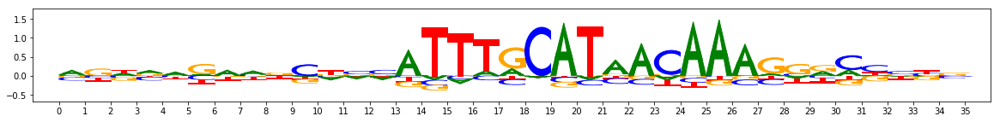

37


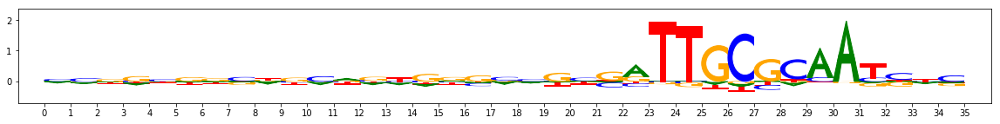

38


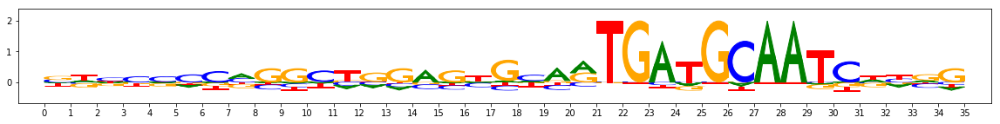

39


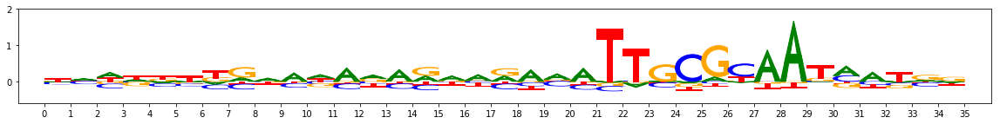

40


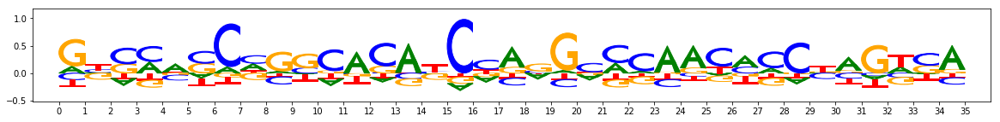

41


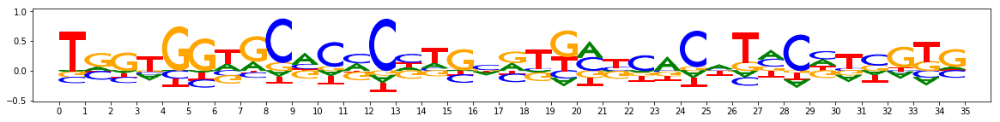

42


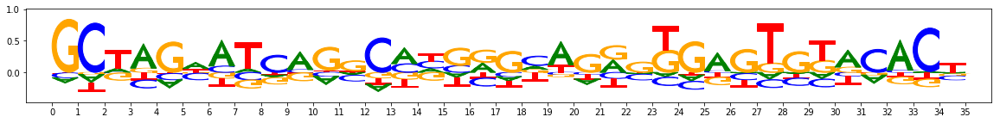

43


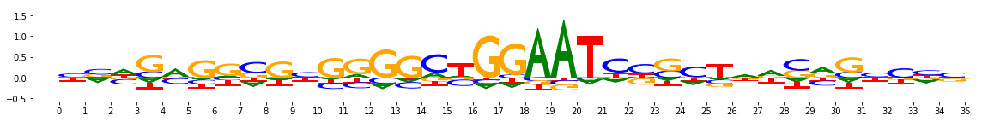

44


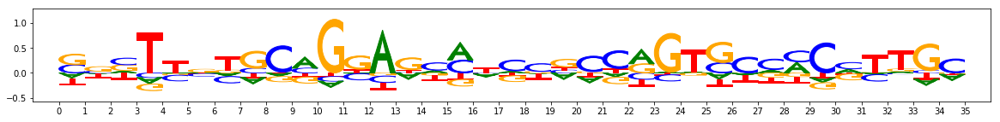

45


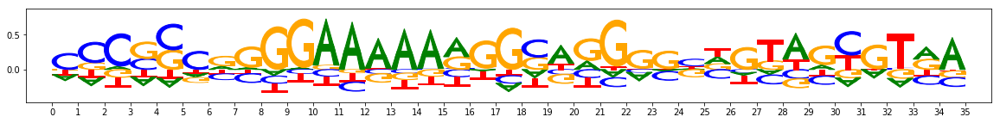

46


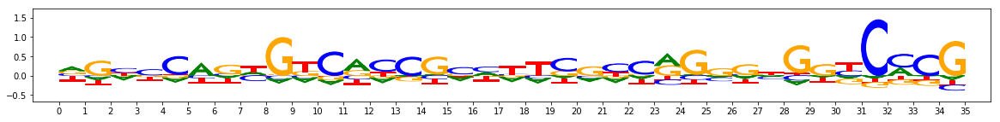

47


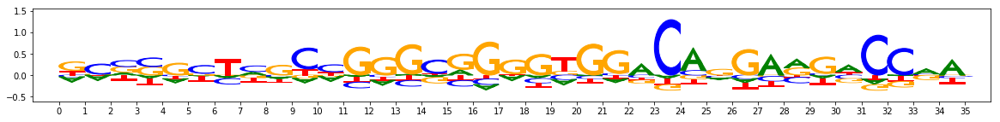

48


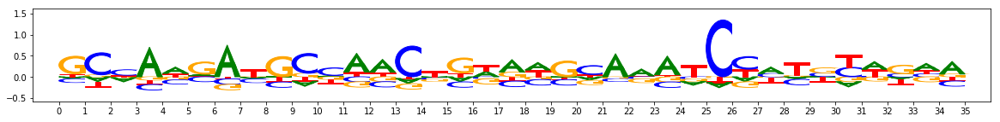

49


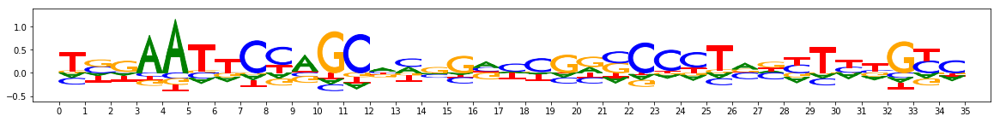

50


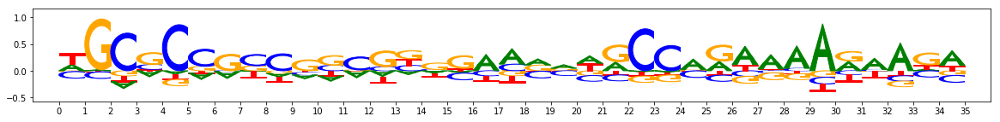

51


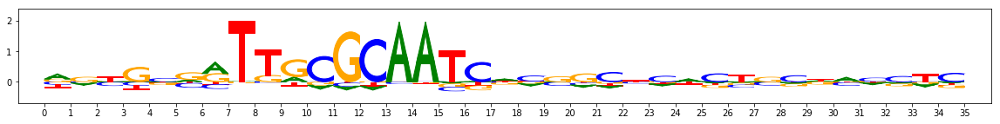

52


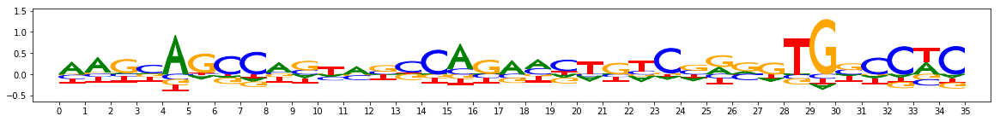

53


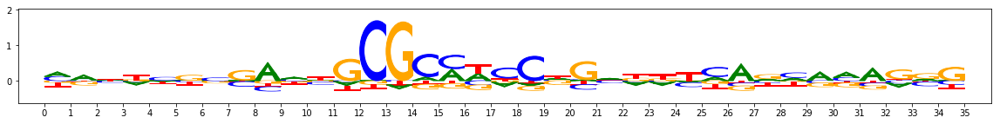

54


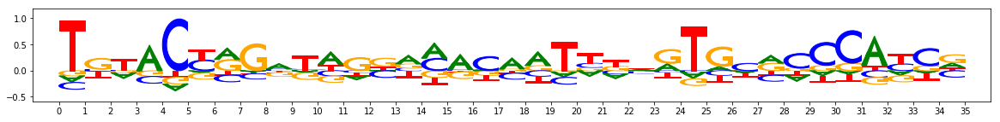

55


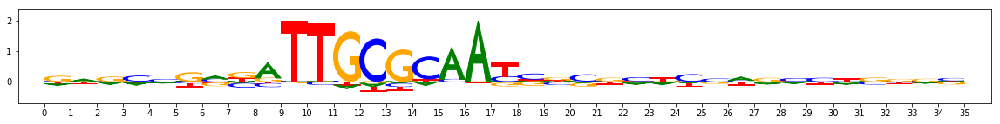

56


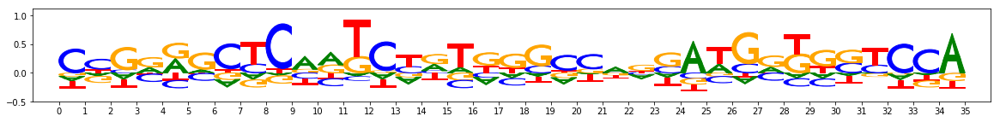

57


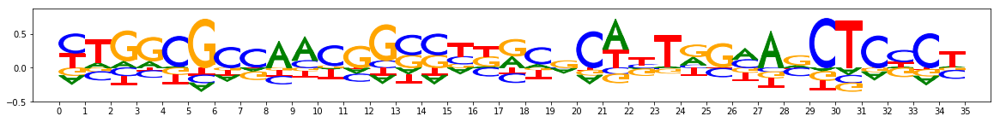

58


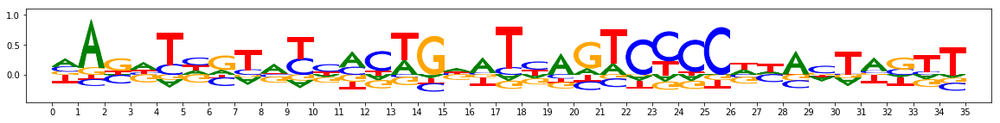

59


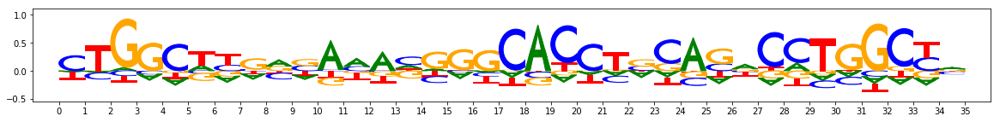

In [82]:
for i,elem in enumerate(info):
    print(i)
    viz_sequence.plot_weights(elem)

In [87]:
from plot import *

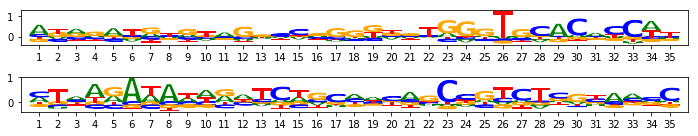

In [133]:
fig = seqlogo_fig(info_2.transpose(1,0,2),vocab='DNA')

In [96]:
import matplotlib.pyplot as plt

In [130]:
info_2 = np.concatenate([np.expand_dims(info[0],axis=-1),np.expand_dims(info[1],axis=-1)],axis=-1)



In [136]:
info_all = np.concatenate(np.expand_dims(info,axis=-1),axis=-1)

0
1
2
3


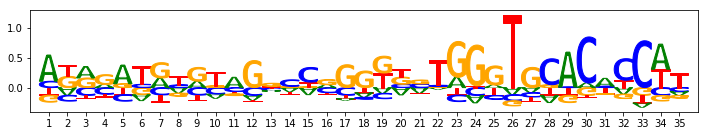

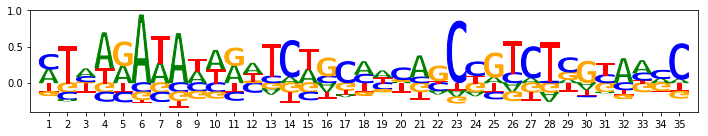

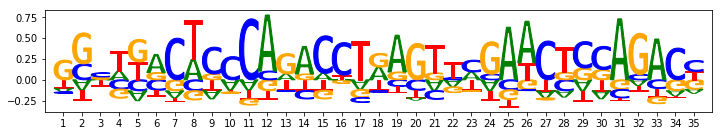

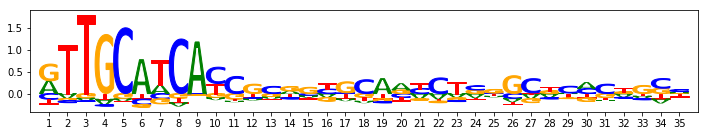

In [153]:
for i,pwm in enumerate(info):
    print(i)
    seqlogo_fig(pwm.transpose(),'DNA');
#     fig.savefig(fname='fig%s.png'%(str(i)))
    if i==3:
        break

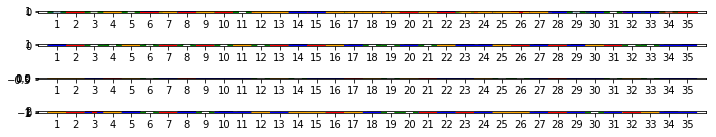

In [143]:
fig = seqlogo_fig(info_all.transpose(1,0,2)[:,:,0:4],vocab='DNA')

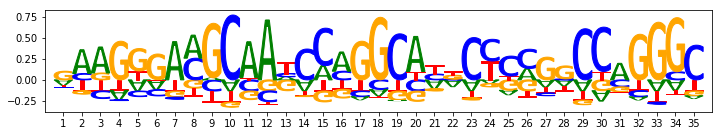

In [154]:
seqlogo_fig(info[10].transpose(),'DNA');

In [155]:
:qfrom plot import VOCABS

'blue'

In [167]:
from pwm_utils import *

In [193]:
counts,info = pfm_counts_pipeline_seq_models(pos_bedtools_CEBPB_H1,genome_path,model_seq,
                                             conv_layer_name = 'conv_layer_1',savedir = './tmp')

Creating intervals list 

Reshaping Intervals and filters to use tf.nn.conv2D
All shapes are compatible:
Proceeding with convolutions:
Doing filter 0
Doing filter 1
Doing filter 2
Doing filter 3
Doing filter 4
Doing filter 5
Doing filter 6
Doing filter 7
Doing filter 8
Doing filter 9
Doing filter 10
Doing filter 11
Doing filter 12
Doing filter 13
Doing filter 14
Doing filter 15
Doing filter 16
Doing filter 17
Doing filter 18
Doing filter 19
Doing filter 20
Doing filter 21
Doing filter 22
Doing filter 23
Doing filter 24
Doing filter 25
Doing filter 26
Doing filter 27
Doing filter 28
Doing filter 29
Doing filter 30
Doing filter 31
Doing filter 32
Doing filter 33
Doing filter 34
Doing filter 35
Doing filter 36
Doing filter 37
Doing filter 38
Doing filter 39
Doing filter 40
Doing filter 41
Doing filter 42
Doing filter 43
Doing filter 44
Doing filter 45
Doing filter 46
Doing filter 47
Doing filter 48
Doing filter 49
Doing filter 50
Doing filter 51
Doing filter 52
Doing filter 53
Doing filte

In [187]:
model_seq.get_layer('conv_layer_1').get_weights()

FailedPreconditionError: Attempting to use uninitialized value conv_layer_1_W_5
	 [[Node: conv_layer_1_W_5/_8 = _Send[T=DT_FLOAT, client_terminated=false, recv_device="/job:localhost/replica:0/task:0/cpu:0", send_device="/job:localhost/replica:0/task:0/gpu:0", send_device_incarnation=1, tensor_name="edge_5_conv_layer_1_W_5", _device="/job:localhost/replica:0/task:0/gpu:0"](conv_layer_1_W_5)]]
	 [[Node: conv_layer_1_W_5/_9 = _Recv[_start_time=0, client_terminated=false, recv_device="/job:localhost/replica:0/task:0/cpu:0", send_device="/job:localhost/replica:0/task:0/gpu:0", send_device_incarnation=1, tensor_name="edge_5_conv_layer_1_W_5", tensor_type=DT_FLOAT, _device="/job:localhost/replica:0/task:0/cpu:0"]()]]

Saved information content matrices to here 



In [194]:
filepath = '/srv/scratch/manyu/NIPS_workshop_tests/motif_analysis/tmp/'

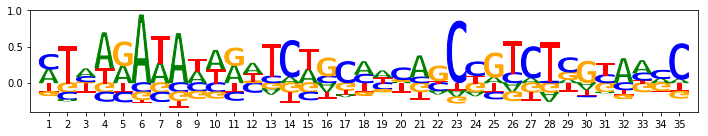

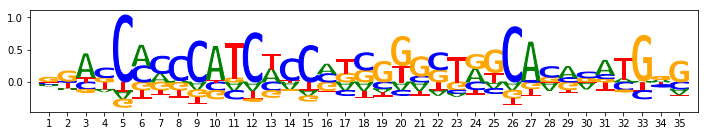

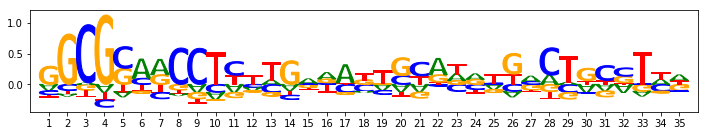

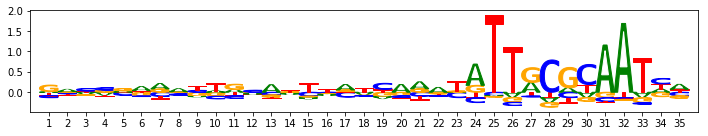

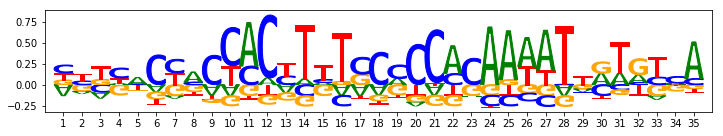

...

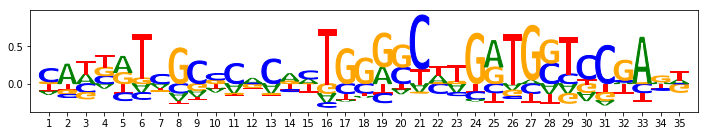

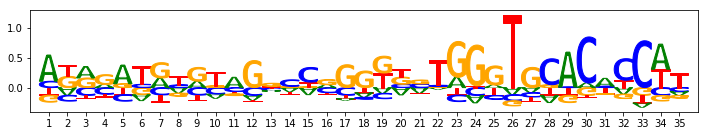

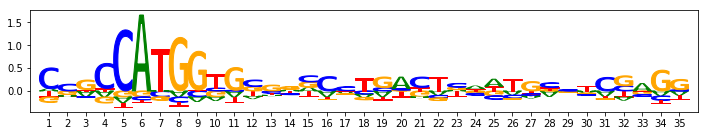

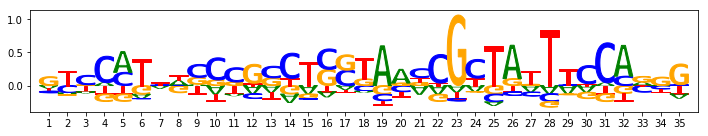

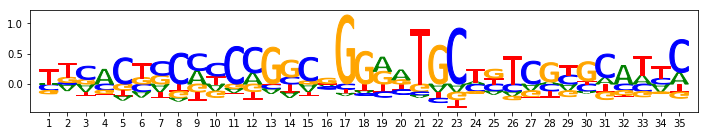

In [203]:
import glob
import re

for file in glob.glob(filepath+'/*'):
    file = os.path.abspath(file)
    count = 0
    
    if 'info' in file:
        count+=1
    

In [206]:
arr_path = '/srv/scratch/manyu/NIPS_workshop_tests/motif_analysis/tmp/pfm_counts_arr10.npy'
arr = np.load(arr_path)

In [208]:
counts = np.load('/srv/scratch/manyu/NIPS_workshop_tests/motif_analysis/tmp/pfm_counts.npy')

In [210]:
len(counts)

60

[autoreload of pwm_utils failed: Traceback (most recent call last):
  File "/users/manyu/anaconda3/envs/pwm_utils/lib/python2.7/site-packages/IPython/extensions/autoreload.py", line 247, in check
    superreload(m, reload, self.old_objects)
  File "pwm_utils.py", line 196
    fig.savefig(file
      ^
SyntaxError: invalid syntax
]


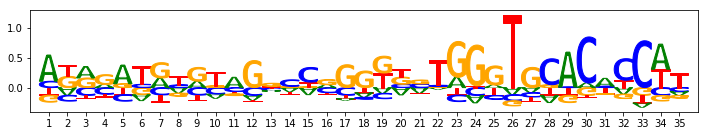

In [217]:
fig = seqlogo_fig(info[0].transpose())

In [225]:
plot_all_information_matrices('/srv/scratch/manyu/NIPS_workshop_tests/motif_analysis/tmp/')

[autoreload of pwm_utils failed: Traceback (most recent call last):
  File "/users/manyu/anaconda3/envs/pwm_utils/lib/python2.7/site-packages/IPython/extensions/autoreload.py", line 247, in check
    superreload(m, reload, self.old_objects)
  File "pwm_utils.py", line 208
    fig.savefig(filepath+'/info_pwm{}.png'.format(str(i)))
      ^
SyntaxError: invalid syntax
]


NameError: name 'plot_all_information_matrices' is not defined

In [228]:
from plot import seqlogo_fig

In [229]:
import pwm_utils

In [246]:
from pwm_utils import *

Saved all images to ./tmp


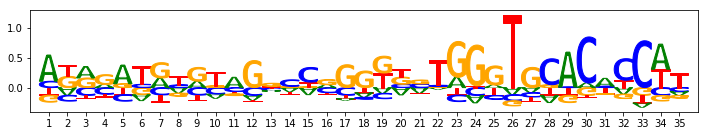

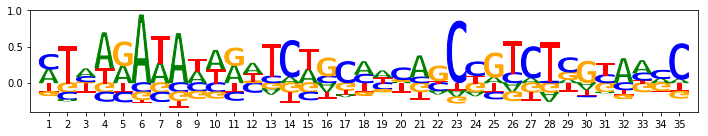

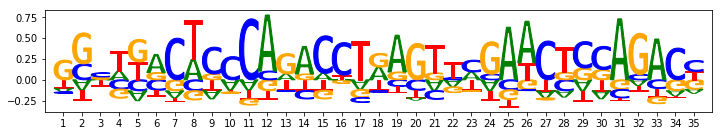

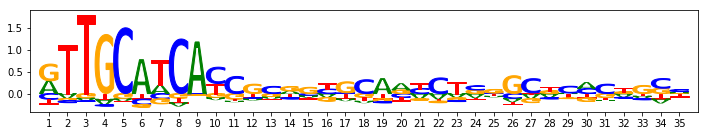

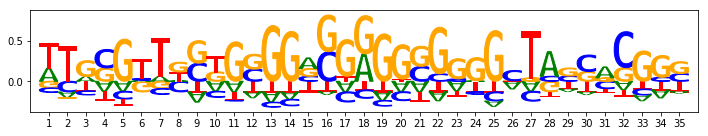

...

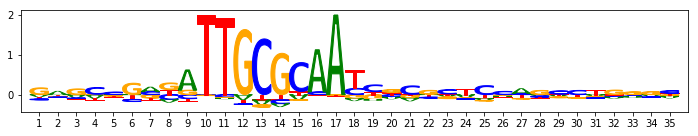

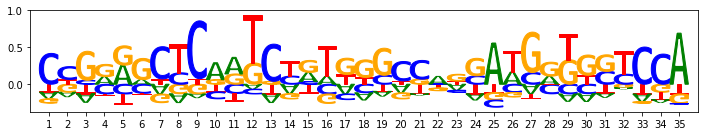

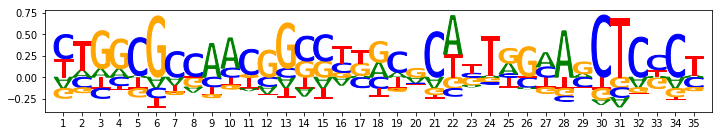

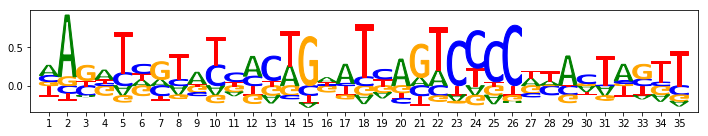

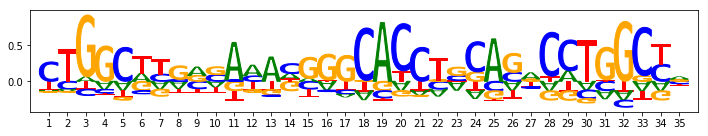

In [247]:
plot_and_save_information_matrices('./tmp')

In [248]:
meth_file_path = '/srv/scratch/manyu/memmap_bcolz/H1-hESC-WGBS-HAIB-rep1+rep2.normalized.bigWig/'
meth_extractor = ArrayExtractor(meth_file_path)


In [249]:
extracted_intervals_meth = 

In [411]:
small_pos_intervals_set = [pos_bedtools_CEBPB_H1[i] for i in range(2500,3000)]

In [258]:
extracted_intervals_seq = genome_extractor(small_pos_intervals_set)
extracted_intervals_meth = meth_extractor(small_pos_intervals_set)

In [259]:
extracted_intervals_seq.shape,extracted_intervals_meth.shape

((500, 1000, 4), (500, 1000))

In [265]:
extracted_intervals_seq[:,:,1]shape

SyntaxError: invalid syntax (<ipython-input-265-1737de6132b9>, line 1)

In [304]:
c_locations = extracted_intervals_seq[:,:,1]
g_locations = extracted_intervals_seq[:,:,2]
c_meth = np.expand_dims(c_locations*extracted_intervals_meth,axis=-1)
g_meth = np.expand_dims(g_locations*extracted_intervals_meth,axis=-1)
seq_meth_input = np.concatenate([c_meth,extracted_intervals_seq,g_meth],axis=-1)

In [306]:
c_meth.shape,g_meth.shape,extracted_intervals_seq.shape

((500, 1000, 1), (500, 1000, 1), (500, 1000, 4))

In [309]:
seq_meth_input = np.concatenate([c_meth,extracted_intervals_seq,g_meth],axis=-1)

In [328]:
np.zeros((6,10))[3:,:]

array([[0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       [0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       [0., 0., 0., 0., 0., 0., 0., 0., 0., 0.]])

In [331]:
arr = np.arange(60).reshape((6,10))

[autoreload of pwm_utils failed: Traceback (most recent call last):
  File "/users/manyu/anaconda3/envs/pwm_utils/lib/python2.7/site-packages/IPython/extensions/autoreload.py", line 247, in check
    superreload(m, reload, self.old_objects)
  File "pwm_utils.py", line 197
    def pfm_counts_pipeline_seq_meth_5mC_models(intervals_bedtool,genome_path,5mC_methylation_path,model,
                                                                              ^
SyntaxError: invalid syntax
]


In [412]:
##Reload the model again
with open(path_to_seq_meth_yaml,'r') as f:
    model_seq_meth = model_from_yaml(f.read())

model_seq_meth.load_weights(path_to_seq_meth_model_weights) 



Creating intervals list 

Reshaping Intervals and filters to use tf.nn.conv2D
All shapes are compatible:
Proceeding with convolutions:
Doing filter 0
Doing filter 1
Doing filter 2
Doing filter 3
Doing filter 4
Doing filter 5
Doing filter 6
Doing filter 7
Doing filter 8
Doing filter 9
Doing filter 10
Doing filter 11
Doing filter 12
Doing filter 13
Doing filter 14
Doing filter 15
Doing filter 16
Doing filter 17
Doing filter 18
Doing filter 19
Doing filter 20
Doing filter 21
Doing filter 22
Doing filter 23
Doing filter 24
Doing filter 25
Doing filter 26
Doing filter 27
Doing filter 28
Doing filter 29
Doing filter 30
Doing filter 31
Doing filter 32
Doing filter 33
Doing filter 34
Doing filter 35
Doing filter 36
Doing filter 37
Doing filter 38
Doing filter 39
Doing filter 40
Doing filter 41
Doing filter 42
Doing filter 43
Doing filter 44
Doing filter 45
Doing filter 46
Doing filter 47
Doing filter 48
Doing filter 49
Doing filter 50
Doing filter 51
Doing filter 52
Doing filter 53
Doing filte

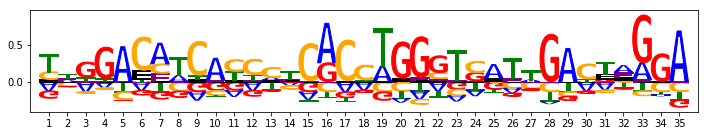

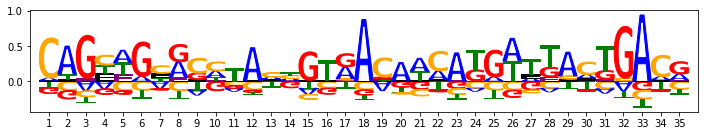

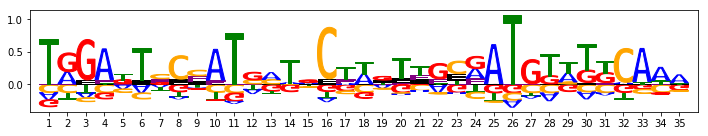

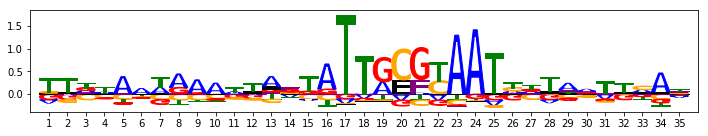

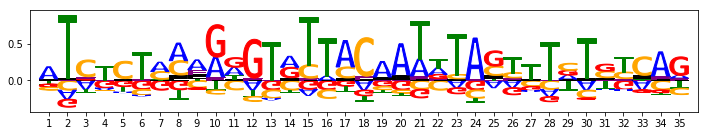

...

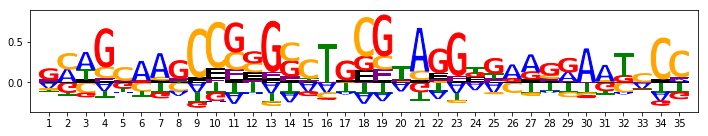

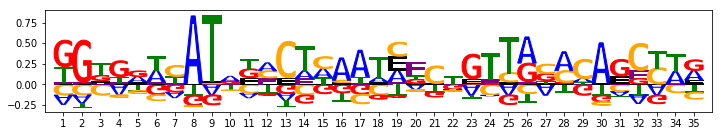

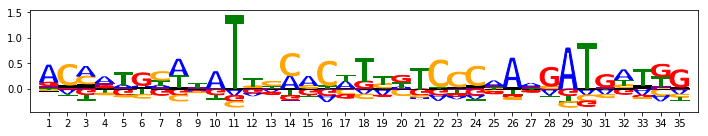

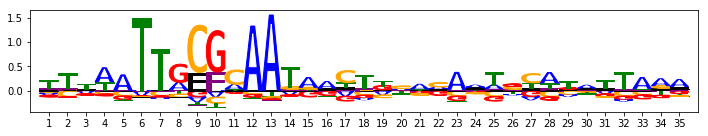

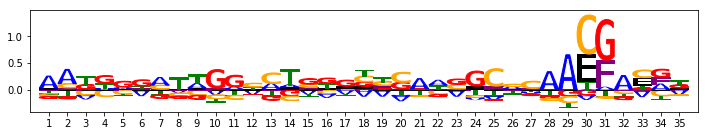

In [413]:
pfm_counts,info_list = pfm_counts_pipeline_seq_meth_5mC_models(small_pos_intervals_set,genome_path,meth_file_path,model_seq_meth,savedir='./tmp',num_intervals=500)
plot_and_save_information_content_pwms('./tmp',vocab='Meth_6_channel')

In [384]:
filters,biases = model_seq_meth.get_layer('conv_layer_1').get_weights()

In [414]:
filters.shape,biases.shape

((35, 6, 60), (60,))

In [386]:
filters=filters.squeeze()

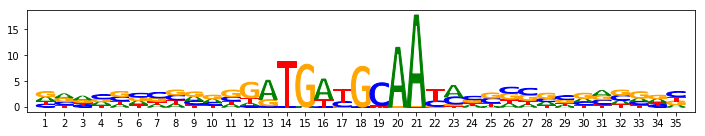

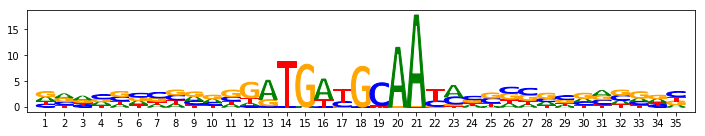

In [410]:
seqlogo_fig(np.exp(5*filters[:,:,5][:,1:5]),'DNA')

In [422]:
from IPython.display import Image,display

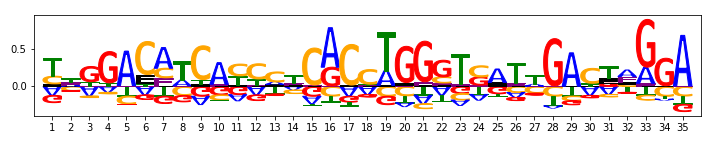

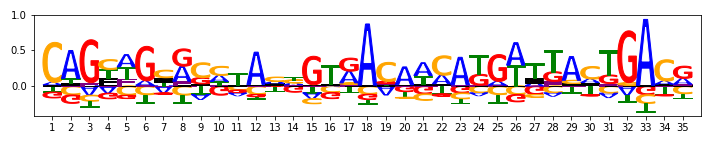

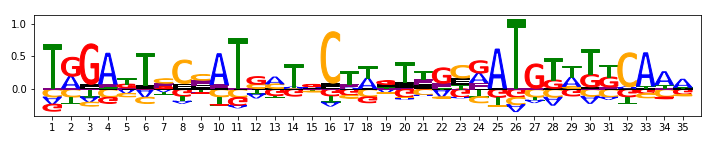

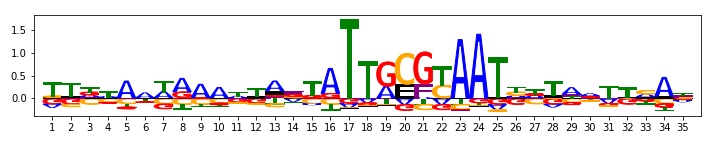

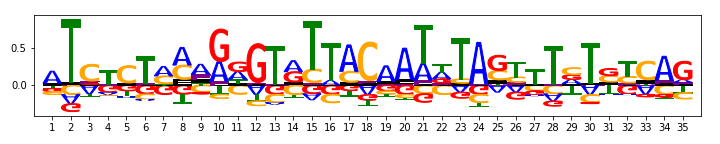

...

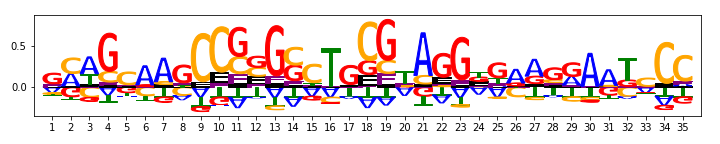

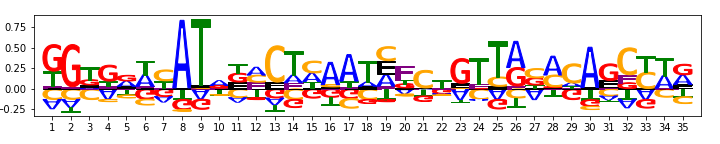

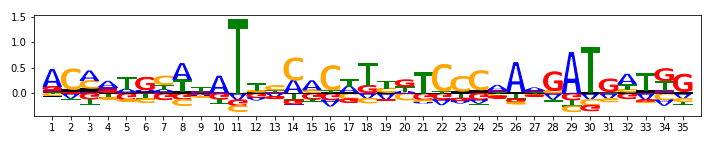

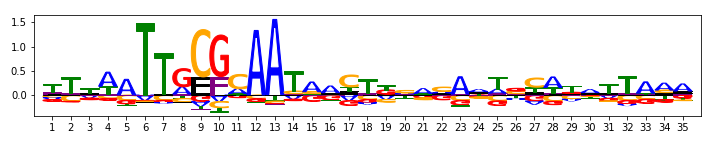

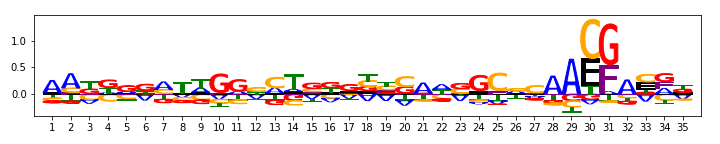

In [423]:
for i in range(60):
    filename_ = './tmp/info_pwm{}.png'.format((str(i)))
    #print(filename_)
    display(Image(filename=filename_))

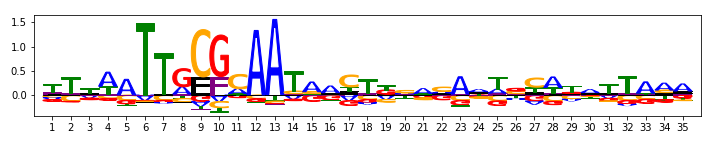

In [421]:
Image('./tmp/info_pwm58.png')